In [69]:
from pathlib import Path
import pandas as pd
import hashlib

def md5(fname):
    hash_md5 = hashlib.md5()
    with open(fname, "rb") as f:
        for chunk in iter(lambda: f.read(4096), b""):
            hash_md5.update(chunk)
    return hash_md5.hexdigest()


files = list(Path("./Train-Test-Data/public-test/").glob("*"))
filenames = [f.name for f in files]
md5s = [md5(str(f)) for f in files]
df_test = pd.DataFrame({"filenames": filenames, "md5": md5s})
assert len(df_test["md5"].unique()) == len(df_test)


In [113]:
#files = list(Path("./Train-Test-Data/dataset/").glob("**/**/*.wav"))
# Note that there are superflous subfolders so doing this glob is better
files = list(Path("./Train-Test-Data/dataset/").glob("./*/*.wav"))
folder = [f.parent for f in files]
filenames = [f.name for f in files]
md5s = [md5(str(f)) for f in files]
df_train = pd.DataFrame({"filenames": filenames, "md5": md5s, "folder": folder})
assert len(df_train["md5"].unique()) == len(df_train), "The train set contains duplicates!"

In [111]:
# Perform cleanup of duplicated files in the train set
import os
dupes = df_train["md5"].duplicated(keep=False)
df_train[df_train["md5"] == "7d557aca8c0d40d8b73c1d6441cc46eb"]
df_train[dupes]
os.remove("./Train-Test-Data/dataset/657-M-25/657-8(1).wav")
os.remove("./Train-Test-Data/dataset/657-M-25/657-9(1).wav")
os.remove("./Train-Test-Data/dataset/657-M-25/657-M-25(1).wav")
os.remove("./Train-Test-Data/dataset/657-M-25/657(1).wav")

In [135]:
from tqdm import tqdm
df_test_sub = pd.read_csv("./Train-Test-Data/public-test.csv")
for i, row in tqdm(df_test_sub.iterrows()):
    assert row["audio_2"] != row["audio_1"], "They compare the same file against itself! Trivial!"



50000it [00:04, 11019.50it/s]


In [146]:
all_unique_fnames = set(df_test_sub["audio_1"].unique()) | set(df_test_sub["audio_2"].unique())
comparisons = []
for fname in tqdm(all_unique_fnames):
    num_comparisons = (df_test_sub["audio_1"] == fname).sum() + (df_test_sub["audio_2"] == fname).sum()
    comparisons.append(num_comparisons)

100%|██████████| 2789/2789 [00:15<00:00, 182.32it/s]


<AxesSubplot:>

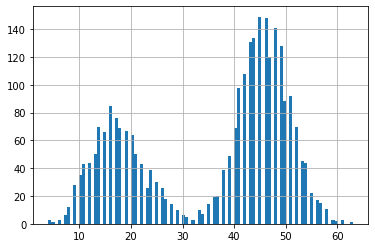

In [155]:
# A given song is compared against 4 to 63 other songs
data = pd.DataFrame({"fnames": list(all_unique_fnames), "comparisons": comparisons})
data["comparisons"].hist(bins=100)
# There is some kind of structure here...but not sure why!

In [157]:
data["comparisons"].min(), data["comparisons"].max()

(4, 63)

In [160]:
df_test_sub["label"] = 0 
df_test_sub.to_csv("null_model_submission_public-test.csv", index=False)
# The simple null model obtains exactly 50% accuracy, suggesting that the test set is distributed such that there is an equal number of matches to non-matches. 50% chance of being a match.
# This suggests the model needs very balanced precision/recall i.e. accuracy is a suitable metric.

In [191]:
from wavinfo import WavInfoReader
files = list(Path("./Train-Test-Data/dataset/").glob("./*/*.wav"))
for file in files:
    info = WavInfoReader(files[0])
    print(info.data._asdict(), info.info)

OrderedDict([('byte_count', 95270), ('frame_count', 47635)]) {'copyright': None, 'product': None, 'album': None, 'genre': None, 'artist': None, 'comment': None, 'software': 'Lavf57.83.100 (libsndfile-)', 'created_date': None, 'engineer': None, 'keywords': None, 'title': '747', 'source': None, 'tape': None, 'commissioned': None, 'archival_location': None, 'subject': None, 'technician': None, 'encoding': 'latin_1'}
OrderedDict([('byte_count', 95270), ('frame_count', 47635)]) {'copyright': None, 'product': None, 'album': None, 'genre': None, 'artist': None, 'comment': None, 'software': 'Lavf57.83.100 (libsndfile-)', 'created_date': None, 'engineer': None, 'keywords': None, 'title': '747', 'source': None, 'tape': None, 'commissioned': None, 'archival_location': None, 'subject': None, 'technician': None, 'encoding': 'latin_1'}
OrderedDict([('byte_count', 95270), ('frame_count', 47635)]) {'copyright': None, 'product': None, 'album': None, 'genre': None, 'artist': None, 'comment': None, 'soft

OrderedDict([('byte_count', 95270), ('frame_count', 47635)]) {'copyright': None, 'product': None, 'album': None, 'genre': None, 'artist': None, 'comment': None, 'software': 'Lavf57.83.100 (libsndfile-)', 'created_date': None, 'engineer': None, 'keywords': None, 'title': '747', 'source': None, 'tape': None, 'commissioned': None, 'archival_location': None, 'subject': None, 'technician': None, 'encoding': 'latin_1'}
OrderedDict([('byte_count', 95270), ('frame_count', 47635)]) {'copyright': None, 'product': None, 'album': None, 'genre': None, 'artist': None, 'comment': None, 'software': 'Lavf57.83.100 (libsndfile-)', 'created_date': None, 'engineer': None, 'keywords': None, 'title': '747', 'source': None, 'tape': None, 'commissioned': None, 'archival_location': None, 'subject': None, 'technician': None, 'encoding': 'latin_1'}
OrderedDict([('byte_count', 95270), ('frame_count', 47635)]) {'copyright': None, 'product': None, 'album': None, 'genre': None, 'artist': None, 'comment': None, 'soft

OrderedDict([('byte_count', 95270), ('frame_count', 47635)]) {'copyright': None, 'product': None, 'album': None, 'genre': None, 'artist': None, 'comment': None, 'software': 'Lavf57.83.100 (libsndfile-)', 'created_date': None, 'engineer': None, 'keywords': None, 'title': '747', 'source': None, 'tape': None, 'commissioned': None, 'archival_location': None, 'subject': None, 'technician': None, 'encoding': 'latin_1'}
OrderedDict([('byte_count', 95270), ('frame_count', 47635)]) {'copyright': None, 'product': None, 'album': None, 'genre': None, 'artist': None, 'comment': None, 'software': 'Lavf57.83.100 (libsndfile-)', 'created_date': None, 'engineer': None, 'keywords': None, 'title': '747', 'source': None, 'tape': None, 'commissioned': None, 'archival_location': None, 'subject': None, 'technician': None, 'encoding': 'latin_1'}
OrderedDict([('byte_count', 95270), ('frame_count', 47635)]) {'copyright': None, 'product': None, 'album': None, 'genre': None, 'artist': None, 'comment': None, 'soft

OrderedDict([('byte_count', 95270), ('frame_count', 47635)]) {'copyright': None, 'product': None, 'album': None, 'genre': None, 'artist': None, 'comment': None, 'software': 'Lavf57.83.100 (libsndfile-)', 'created_date': None, 'engineer': None, 'keywords': None, 'title': '747', 'source': None, 'tape': None, 'commissioned': None, 'archival_location': None, 'subject': None, 'technician': None, 'encoding': 'latin_1'}
OrderedDict([('byte_count', 95270), ('frame_count', 47635)]) {'copyright': None, 'product': None, 'album': None, 'genre': None, 'artist': None, 'comment': None, 'software': 'Lavf57.83.100 (libsndfile-)', 'created_date': None, 'engineer': None, 'keywords': None, 'title': '747', 'source': None, 'tape': None, 'commissioned': None, 'archival_location': None, 'subject': None, 'technician': None, 'encoding': 'latin_1'}
OrderedDict([('byte_count', 95270), ('frame_count', 47635)]) {'copyright': None, 'product': None, 'album': None, 'genre': None, 'artist': None, 'comment': None, 'soft

OrderedDict([('byte_count', 95270), ('frame_count', 47635)]) {'copyright': None, 'product': None, 'album': None, 'genre': None, 'artist': None, 'comment': None, 'software': 'Lavf57.83.100 (libsndfile-)', 'created_date': None, 'engineer': None, 'keywords': None, 'title': '747', 'source': None, 'tape': None, 'commissioned': None, 'archival_location': None, 'subject': None, 'technician': None, 'encoding': 'latin_1'}
OrderedDict([('byte_count', 95270), ('frame_count', 47635)]) {'copyright': None, 'product': None, 'album': None, 'genre': None, 'artist': None, 'comment': None, 'software': 'Lavf57.83.100 (libsndfile-)', 'created_date': None, 'engineer': None, 'keywords': None, 'title': '747', 'source': None, 'tape': None, 'commissioned': None, 'archival_location': None, 'subject': None, 'technician': None, 'encoding': 'latin_1'}
OrderedDict([('byte_count', 95270), ('frame_count', 47635)]) {'copyright': None, 'product': None, 'album': None, 'genre': None, 'artist': None, 'comment': None, 'soft

OrderedDict([('byte_count', 95270), ('frame_count', 47635)]) {'copyright': None, 'product': None, 'album': None, 'genre': None, 'artist': None, 'comment': None, 'software': 'Lavf57.83.100 (libsndfile-)', 'created_date': None, 'engineer': None, 'keywords': None, 'title': '747', 'source': None, 'tape': None, 'commissioned': None, 'archival_location': None, 'subject': None, 'technician': None, 'encoding': 'latin_1'}
OrderedDict([('byte_count', 95270), ('frame_count', 47635)]) {'copyright': None, 'product': None, 'album': None, 'genre': None, 'artist': None, 'comment': None, 'software': 'Lavf57.83.100 (libsndfile-)', 'created_date': None, 'engineer': None, 'keywords': None, 'title': '747', 'source': None, 'tape': None, 'commissioned': None, 'archival_location': None, 'subject': None, 'technician': None, 'encoding': 'latin_1'}
OrderedDict([('byte_count', 95270), ('frame_count', 47635)]) {'copyright': None, 'product': None, 'album': None, 'genre': None, 'artist': None, 'comment': None, 'soft

OrderedDict([('byte_count', 95270), ('frame_count', 47635)]) {'copyright': None, 'product': None, 'album': None, 'genre': None, 'artist': None, 'comment': None, 'software': 'Lavf57.83.100 (libsndfile-)', 'created_date': None, 'engineer': None, 'keywords': None, 'title': '747', 'source': None, 'tape': None, 'commissioned': None, 'archival_location': None, 'subject': None, 'technician': None, 'encoding': 'latin_1'}
OrderedDict([('byte_count', 95270), ('frame_count', 47635)]) {'copyright': None, 'product': None, 'album': None, 'genre': None, 'artist': None, 'comment': None, 'software': 'Lavf57.83.100 (libsndfile-)', 'created_date': None, 'engineer': None, 'keywords': None, 'title': '747', 'source': None, 'tape': None, 'commissioned': None, 'archival_location': None, 'subject': None, 'technician': None, 'encoding': 'latin_1'}
OrderedDict([('byte_count', 95270), ('frame_count', 47635)]) {'copyright': None, 'product': None, 'album': None, 'genre': None, 'artist': None, 'comment': None, 'soft

OrderedDict([('byte_count', 95270), ('frame_count', 47635)]) {'copyright': None, 'product': None, 'album': None, 'genre': None, 'artist': None, 'comment': None, 'software': 'Lavf57.83.100 (libsndfile-)', 'created_date': None, 'engineer': None, 'keywords': None, 'title': '747', 'source': None, 'tape': None, 'commissioned': None, 'archival_location': None, 'subject': None, 'technician': None, 'encoding': 'latin_1'}
OrderedDict([('byte_count', 95270), ('frame_count', 47635)]) {'copyright': None, 'product': None, 'album': None, 'genre': None, 'artist': None, 'comment': None, 'software': 'Lavf57.83.100 (libsndfile-)', 'created_date': None, 'engineer': None, 'keywords': None, 'title': '747', 'source': None, 'tape': None, 'commissioned': None, 'archival_location': None, 'subject': None, 'technician': None, 'encoding': 'latin_1'}
OrderedDict([('byte_count', 95270), ('frame_count', 47635)]) {'copyright': None, 'product': None, 'album': None, 'genre': None, 'artist': None, 'comment': None, 'soft

OrderedDict([('byte_count', 95270), ('frame_count', 47635)]) {'copyright': None, 'product': None, 'album': None, 'genre': None, 'artist': None, 'comment': None, 'software': 'Lavf57.83.100 (libsndfile-)', 'created_date': None, 'engineer': None, 'keywords': None, 'title': '747', 'source': None, 'tape': None, 'commissioned': None, 'archival_location': None, 'subject': None, 'technician': None, 'encoding': 'latin_1'}
OrderedDict([('byte_count', 95270), ('frame_count', 47635)]) {'copyright': None, 'product': None, 'album': None, 'genre': None, 'artist': None, 'comment': None, 'software': 'Lavf57.83.100 (libsndfile-)', 'created_date': None, 'engineer': None, 'keywords': None, 'title': '747', 'source': None, 'tape': None, 'commissioned': None, 'archival_location': None, 'subject': None, 'technician': None, 'encoding': 'latin_1'}
OrderedDict([('byte_count', 95270), ('frame_count', 47635)]) {'copyright': None, 'product': None, 'album': None, 'genre': None, 'artist': None, 'comment': None, 'soft

OrderedDict([('byte_count', 95270), ('frame_count', 47635)]) {'copyright': None, 'product': None, 'album': None, 'genre': None, 'artist': None, 'comment': None, 'software': 'Lavf57.83.100 (libsndfile-)', 'created_date': None, 'engineer': None, 'keywords': None, 'title': '747', 'source': None, 'tape': None, 'commissioned': None, 'archival_location': None, 'subject': None, 'technician': None, 'encoding': 'latin_1'}
OrderedDict([('byte_count', 95270), ('frame_count', 47635)]) {'copyright': None, 'product': None, 'album': None, 'genre': None, 'artist': None, 'comment': None, 'software': 'Lavf57.83.100 (libsndfile-)', 'created_date': None, 'engineer': None, 'keywords': None, 'title': '747', 'source': None, 'tape': None, 'commissioned': None, 'archival_location': None, 'subject': None, 'technician': None, 'encoding': 'latin_1'}
OrderedDict([('byte_count', 95270), ('frame_count', 47635)]) {'copyright': None, 'product': None, 'album': None, 'genre': None, 'artist': None, 'comment': None, 'soft

OrderedDict([('byte_count', 95270), ('frame_count', 47635)]) {'copyright': None, 'product': None, 'album': None, 'genre': None, 'artist': None, 'comment': None, 'software': 'Lavf57.83.100 (libsndfile-)', 'created_date': None, 'engineer': None, 'keywords': None, 'title': '747', 'source': None, 'tape': None, 'commissioned': None, 'archival_location': None, 'subject': None, 'technician': None, 'encoding': 'latin_1'}
OrderedDict([('byte_count', 95270), ('frame_count', 47635)]) {'copyright': None, 'product': None, 'album': None, 'genre': None, 'artist': None, 'comment': None, 'software': 'Lavf57.83.100 (libsndfile-)', 'created_date': None, 'engineer': None, 'keywords': None, 'title': '747', 'source': None, 'tape': None, 'commissioned': None, 'archival_location': None, 'subject': None, 'technician': None, 'encoding': 'latin_1'}
OrderedDict([('byte_count', 95270), ('frame_count', 47635)]) {'copyright': None, 'product': None, 'album': None, 'genre': None, 'artist': None, 'comment': None, 'soft

OrderedDict([('byte_count', 95270), ('frame_count', 47635)]) {'copyright': None, 'product': None, 'album': None, 'genre': None, 'artist': None, 'comment': None, 'software': 'Lavf57.83.100 (libsndfile-)', 'created_date': None, 'engineer': None, 'keywords': None, 'title': '747', 'source': None, 'tape': None, 'commissioned': None, 'archival_location': None, 'subject': None, 'technician': None, 'encoding': 'latin_1'}
OrderedDict([('byte_count', 95270), ('frame_count', 47635)]) {'copyright': None, 'product': None, 'album': None, 'genre': None, 'artist': None, 'comment': None, 'software': 'Lavf57.83.100 (libsndfile-)', 'created_date': None, 'engineer': None, 'keywords': None, 'title': '747', 'source': None, 'tape': None, 'commissioned': None, 'archival_location': None, 'subject': None, 'technician': None, 'encoding': 'latin_1'}
OrderedDict([('byte_count', 95270), ('frame_count', 47635)]) {'copyright': None, 'product': None, 'album': None, 'genre': None, 'artist': None, 'comment': None, 'soft

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



OrderedDict([('byte_count', 95270), ('frame_count', 47635)]) {'copyright': None, 'product': None, 'album': None, 'genre': None, 'artist': None, 'comment': None, 'software': 'Lavf57.83.100 (libsndfile-)', 'created_date': None, 'engineer': None, 'keywords': None, 'title': '747', 'source': None, 'tape': None, 'commissioned': None, 'archival_location': None, 'subject': None, 'technician': None, 'encoding': 'latin_1'}
OrderedDict([('byte_count', 95270), ('frame_count', 47635)]) {'copyright': None, 'product': None, 'album': None, 'genre': None, 'artist': None, 'comment': None, 'software': 'Lavf57.83.100 (libsndfile-)', 'created_date': None, 'engineer': None, 'keywords': None, 'title': '747', 'source': None, 'tape': None, 'commissioned': None, 'archival_location': None, 'subject': None, 'technician': None, 'encoding': 'latin_1'}
OrderedDict([('byte_count', 95270), ('frame_count', 47635)]) {'copyright': None, 'product': None, 'album': None, 'genre': None, 'artist': None, 'comment': None, 'soft

OrderedDict([('byte_count', 95270), ('frame_count', 47635)]) {'copyright': None, 'product': None, 'album': None, 'genre': None, 'artist': None, 'comment': None, 'software': 'Lavf57.83.100 (libsndfile-)', 'created_date': None, 'engineer': None, 'keywords': None, 'title': '747', 'source': None, 'tape': None, 'commissioned': None, 'archival_location': None, 'subject': None, 'technician': None, 'encoding': 'latin_1'}
OrderedDict([('byte_count', 95270), ('frame_count', 47635)]) {'copyright': None, 'product': None, 'album': None, 'genre': None, 'artist': None, 'comment': None, 'software': 'Lavf57.83.100 (libsndfile-)', 'created_date': None, 'engineer': None, 'keywords': None, 'title': '747', 'source': None, 'tape': None, 'commissioned': None, 'archival_location': None, 'subject': None, 'technician': None, 'encoding': 'latin_1'}
OrderedDict([('byte_count', 95270), ('frame_count', 47635)]) {'copyright': None, 'product': None, 'album': None, 'genre': None, 'artist': None, 'comment': None, 'soft

In [190]:
info = WavInfoReader(files[0])
info.info

{'copyright': None, 'product': None, 'album': None, 'genre': None, 'artist': None, 'comment': None, 'software': 'Lavf57.83.100 (libsndfile-)', 'created_date': None, 'engineer': None, 'keywords': None, 'title': '747', 'source': None, 'tape': None, 'commissioned': None, 'archival_location': None, 'subject': None, 'technician': None, 'encoding': 'latin_1'}

In [198]:
import audio_metadata
from audio_metadata.exceptions import UnsupportedFormat

for file in files:
    try:
        metadata = audio_metadata.load(file)
        print(metadata)
    except UnsupportedFormat:
        print("unsupported format")
    except Exception as exc:
        print(f"{exc} unhandled")

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/747-F-31/747-8.wav',
    'filesize': '93.23 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['747'],
        'tracknumber': ['18'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/747-F-31/747-10.wav',
    'filesize': '138.76 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0 

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/432-M-27/432-20.wav',
    'filesize': '187.92 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['432'],
        'tracknumber': ['33'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf58.20.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/432-M-27/432-16.wav',
    'filesize': '74.04 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/445-M-32/445-34.wav',
    'filesize': '159.99 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['445'],
        'tracknumber': ['73'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf58.20.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/445-M-32/445-35.wav',
    'filesize': '225.51 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '48.

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/472-M-27/472-25.wav',
    'filesize': '119.00 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['472'],
        'tracknumber': ['52'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/472-M-27/472-10.wav',
    'filesize': '94.09 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/591-M-33/591-29.wav',
    'filesize': '392.00 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:04',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['591'],
        'tracknumber': ['113'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/591-M-33/591-7.wav',
    'filesize': '129.54 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/588-F-27/588-3.wav',
    'filesize': '75.18 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['588'],
        'tracknumber': ['4'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/588-F-27/588-11.wav',
    'filesize': '630.07 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:07',
        'sample_rate': '48.0 K

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/477-M-25/477-11.wav',
    'filesize': '317.46 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:03',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['477'],
        'tracknumber': ['18'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/477-M-25/477-16.wav',
    'filesize': '87.87 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0

unsupported format
unsupported format
Error -3 while decompressing data: incorrect header check unhandled
unsupported format
unsupported format
unsupported format
unsupported format
unsupported format
unsupported format
unsupported format
unsupported format
unsupported format
Error -3 while decompressing data: incorrect header check unhandled
unsupported format
Error -3 while decompressing data: incorrect header check unhandled
unsupported format
Error -3 while decompressing data: incorrect header check unhandled
unsupported format
unsupported format
Error -3 while decompressing data: incorrect header check unhandled
Error -3 while decompressing data: incorrect header check unhandled
unsupported format
Error -3 while decompressing data: incorrect header check unhandled
unsupported format
unsupported format
unsupported format
Error -3 while decompressing data: incorrect header check unhandled
unsupported format
Error -3 while decompressing data: incorrect header check unhandled
<WAVE({


<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/616-M-26/616-13.wav',
    'filesize': '140.41 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['616'],
        'tracknumber': ['21'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/616-M-26/616-8.wav',
    'filesize': '176.16 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '48.0

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/483-M-33/483-2.wav',
    'filesize': '175.29 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['483'],
        'tracknumber': ['83'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/483-M-33/483-17.wav',
    'filesize': '194.05 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '48.0

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/566-F-32/566-7.wav',
    'filesize': '640.39 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:07',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['566'],
        'tracknumber': ['80'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf58.20.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/566-F-32/566-22.wav',
    'filesize': '161.39 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '48.0

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/435-M-31/435-31.wav',
    'filesize': '138.87 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['435'],
        'tracknumber': ['158'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf58.20.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/435-M-31/435-24.wav',
    'filesize': '328.29 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:03',
        'sample_rate': '48

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/725-F-28/725-7.wav',
    'filesize': '323.30 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '1411 Kbps',
        'channels': 2,
        'duration': '00:02',
        'sample_rate': '44.1 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['725'],
        'tracknumber': ['9'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/725-F-28/725.wav',
    'filesize': '333.40 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '1411 Kbps',
        'channels': 2,
        'duration': '00:02',
        'sample_rate': '44.1 K

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/505-F-27/505-17.wav',
    'filesize': '517.59 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:06',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['505'],
        'tracknumber': ['33'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/505-F-27/505-22.wav',
    'filesize': '372.46 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:04',
        'sample_rate': '48.

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/724-M-31/724-16.wav',
    'filesize': '1.10 MiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '1411 Kbps',
        'channels': 2,
        'duration': '00:07',
        'sample_rate': '44.1 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['724'],
        'tracknumber': ['26'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/724-M-31/724-3.wav',
    'filesize': '328.35 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '1411 Kbps',
        'channels': 2,
        'duration': '00:02',
        'sample_rate': '44.1

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/530-M-27/530-6.wav',
    'filesize': '543.54 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:06',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['530'],
        'tracknumber': ['11'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/530-M-27/530-2.wav',
    'filesize': '125.81 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0 

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/450-F-35/450-11.wav',
    'filesize': '263.31 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:03',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['450'],
        'tracknumber': ['113'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf58.20.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/450-F-35/450-6.wav',
    'filesize': '182.35 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '48.

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/482-F-35/482.wav',
    'filesize': '152.51 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['482'],
        'tracknumber': ['76'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/482-F-35/482-35.wav',
    'filesize': '109.24 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0 K

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/634-M-29/634-3.wav',
    'filesize': '160.70 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['634'],
        'tracknumber': ['67'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf58.20.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/634-M-29/634-15.wav',
    'filesize': '653.89 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:07',
        'sample_rate': '48.0

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/514-F-27/514-8.wav',
    'filesize': '298.34 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:03',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['514'],
        'tracknumber': ['11'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/514-F-27/514-2.wav',
    'filesize': '139.51 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0 

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/517-M-28/517-27.wav',
    'filesize': '192.18 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['517'],
        'tracknumber': ['55'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/517-M-28/517-7.wav',
    'filesize': '216.40 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '48.0

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/500-F-27/500-37.wav',
    'filesize': '609.53 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:06',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['500'],
        'tracknumber': ['46'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/500-F-27/500-11.wav',
    'filesize': '159.55 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '48.

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/473-F-28/473-6.wav',
    'filesize': '163.08 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['473'],
        'tracknumber': ['12'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/473-F-28/473-2.wav',
    'filesize': '72.37 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0 K

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/480-F-27/480-22.wav',
    'filesize': '417.90 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:04',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['480'],
        'tracknumber': ['51'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/480-F-27/480-29.wav',
    'filesize': '254.05 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:03',
        'sample_rate': '48.

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/655-F-29/655-3.wav',
    'filesize': '142.12 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['655'],
        'tracknumber': ['8'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf58.20.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/655-F-29/655-12.wav',
    'filesize': '114.65 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0 

    Ignoring ``   `` frame with value ``b'TIT2\x00\x00\x00\x03\x00\x00\x0083TXXX\x00\x00\x00\x17\x00\x00\x00Software\x00Lavf57.83.100'``.
    ``   `` is not supported in the ID3v2.4 specification.
    


<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/590-F-29/590-15.wav',
    'filesize': '213.91 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['590'],
        'tracknumber': ['106'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/590-F-29/590-20.wav',
    'filesize': '236.40 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:03',
        'sample_rate': '48

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/525-M-29/525-21.wav',
    'filesize': '231.29 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['525'],
        'tracknumber': ['36'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/525-M-29/525-22-2.wav',
    'filesize': '70.50 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/489-F-28/489-52.wav',
    'filesize': '119.37 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '706 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '44.1 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['489'],
        'tracknumber': ['80'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/489-F-28/489-17.wav',
    'filesize': '296.68 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '706 Kbps',
        'channels': 1,
        'duration': '00:03',
        'sample_rate': '44.

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/455-F-24/455-9.wav',
    'filesize': '234.91 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:03',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['455'],
        'tracknumber': ['164'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/455-F-24/455-16.wav',
    'filesize': '209.18 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '48.

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/439-F-38/439-24.wav',
    'filesize': '101.01 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['439'],
        'tracknumber': ['132'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf58.20.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/439-F-38/439-17.wav',
    'filesize': '142.42 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '48

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/807-F-28/807-24.wav',
    'filesize': '358.58 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:04',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['807'],
        'tracknumber': ['50'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/807-F-28/807-3.wav',
    'filesize': '135.89 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/673-M-30/673-3.wav',
    'filesize': '181.71 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['673'],
        'tracknumber': ['11'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/673-M-30/673-11.wav',
    'filesize': '240.85 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:03',
        'sample_rate': '48.0

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/441-M-37/441-47.wav',
    'filesize': '718.99 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:08',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['441'],
        'tracknumber': ['83'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf58.20.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/441-M-37/441-34.wav',
    'filesize': '99.38 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/469-F-23/469.wav',
    'filesize': '136.25 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '706 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '44.1 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['469'],
        'tracknumber': ['5'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/469-F-23/469-9.wav',
    'filesize': '191.13 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '706 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '44.1 KHz

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/532-M-27/532-25.wav',
    'filesize': '284.86 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:03',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['532'],
        'tracknumber': ['141'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/532-M-27/532-26.wav',
    'filesize': '234.12 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '48

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/451-M-43/451-5.wav',
    'filesize': '262.19 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:03',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['451'],
        'tracknumber': ['110'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf58.20.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/451-M-43/451-10.wav',
    'filesize': '236.32 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:03',
        'sample_rate': '48.

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/760-M-30/760.wav',
    'filesize': '96.70 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['760'],
        'tracknumber': ['52'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/760-M-30/760-5.wav',
    'filesize': '173.91 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '48.0 KHz

})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/640-M-54/640-6.wav',
    'filesize': '186.09 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['640'],
        'tracknumber': ['12'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf58.20.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/640-M-54/640-28.wav',
    'filesize': '485.15 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:05',
        'sample_rate': '

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/767-F-26/767-20.wav',
    'filesize': '57.76 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '706 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '44.1 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['767'],
        'tracknumber': ['29'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/767-F-26/767-9.wav',
    'filesize': '66.39 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '706 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '44.1 K

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/656-F-25/656-22.wav',
    'filesize': '86.37 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['656'],
        'tracknumber': ['40'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf58.20.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/656-F-25/656-11.wav',
    'filesize': '163.94 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '48.0

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/453-F-27/453-27.wav',
    'filesize': '130.41 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['453'],
        'tracknumber': ['46'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/453-F-27/453-40.wav',
    'filesize': '108.76 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/479-F-24/479-20.wav',
    'filesize': '274.78 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:03',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['479'],
        'tracknumber': ['108'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/479-F-24/479-19.wav',
    'filesize': '75.76 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.

unsupported format
unsupported format
unsupported format
unsupported format
unsupported format
unsupported format
unsupported format
unsupported format
unsupported format
unsupported format
unsupported format
unsupported format
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/646-M-31/646-6.wav',
    'filesize': '169.93 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['646'],
        'tracknumber': ['71'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf58.20.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/646-M-31/646-19.wav',
    'filesize': '124.13 KiB',
    'pictur

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/583-F-28/583-10.wav',
    'filesize': '169.99 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['583'],
        'tracknumber': ['80'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf58.20.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/583-F-28/583-3.wav',
    'filesize': '115.65 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/801-F-26/801-4.wav',
    'filesize': '108.03 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['801'],
        'tracknumber': ['65'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/801-F-26/801-3.wav',
    'filesize': '577.88 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:06',
        'sample_rate': '48.0 

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/793-F-28/793-3.wav',
    'filesize': '208.91 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['793'],
        'tracknumber': ['45'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/793-F-28/793-12.wav',
    'filesize': '129.25 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/587-M-35/587-25.wav',
    'filesize': '268.29 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:03',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['587'],
        'tracknumber': ['105'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf58.20.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/587-M-35/587-9.wav',
    'filesize': '152.90 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '48.

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/448-M-34/448-25.wav',
    'filesize': '68.22 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['448'],
        'tracknumber': ['48'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf58.20.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/448-M-34/448-46.wav',
    'filesize': '376.31 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:04',
        'sample_rate': '48.0

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/491-M-25/491-14.wav',
    'filesize': '177.23 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['491'],
        'tracknumber': ['40'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/491-M-25/491-9.wav',
    'filesize': '110.62 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/585-F-28/585-28.wav',
    'filesize': '770.55 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:08',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['585'],
        'tracknumber': ['44'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf58.20.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/585-F-28/585-13.wav',
    'filesize': '156.30 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '48.

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/619-M-28/619-13.wav',
    'filesize': '206.40 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['619'],
        'tracknumber': ['83'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/619-M-28/619-14.wav',
    'filesize': '404.37 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:04',
        'sample_rate': '48.

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/751-F-31/751.wav',
    'filesize': '393.45 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:04',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['751'],
        'tracknumber': ['1'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/808-M-32/808-6.wav',
    'filesize': '129.80 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0 KHz

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/447-M-28/447-41.wav',
    'filesize': '546.26 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:06',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['447'],
        'tracknumber': ['170'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf58.20.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/447-M-28/447-34.wav',
    'filesize': '89.00 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/444-F-27/444-12.wav',
    'filesize': '932.82 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:10',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['444'],
        'tracknumber': ['18'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf58.20.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/444-F-27/444-24.wav',
    'filesize': '169.18 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '48.

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/426-F-48/426-25.wav',
    'filesize': '61.76 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['426'],
        'tracknumber': ['32'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf58.20.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/426-F-48/426-9.wav',
    'filesize': '62.64 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0 K

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/647-F-32/647-7.wav',
    'filesize': '134.90 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['647'],
        'tracknumber': ['79'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf58.20.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/647-F-32/647-27.wav',
    'filesize': '132.21 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/630-M-35/630-16.wav',
    'filesize': '98.17 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['630'],
        'tracknumber': ['86'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/630-M-35/630-M-35.wav',
    'filesize': '133.80 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48

    Ignoring ``   `` frame with value ``b'103TIT2\x00\x00\x00\x03\x00\x00\x0082TXXX\x00\x00\x00\x17\x00\x00\x00Software\x00Lavf57.83.100'``.
    ``   `` is not supported in the ID3v2.4 specification.
    
    Ignoring ``   `` frame with value ``b'102TIT2\x00\x00\x00\x03\x00\x00\x0082TXXX\x00\x00\x00\x17\x00\x00\x00Software\x00Lavf57.83.100'``.
    ``   `` is not supported in the ID3v2.4 specification.
    
    Ignoring ``   `` frame with value ``b'TIT2\x00\x00\x00\x03\x00\x00\x0082TXXX\x00\x00\x00\x17\x00\x00\x00Software\x00Lavf57.83.100'``.
    ``   `` is not supported in the ID3v2.4 specification.
    


unsupported format
unsupported format
unsupported format
unsupported format
unsupported format
unsupported format
unsupported format
unsupported format
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/82-M-26/82-21.wav',
    'filesize': '140.19 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({})>,
})>
unsupported format
unsupported format
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/459-F-31/459-14.wav',
    'filesize': '121.45 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rat

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/510-F-26/510-34.wav',
    'filesize': '485.37 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:05',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['533'],
        'tracknumber': ['138'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/510-F-26/510-42.wav',
    'filesize': '866.58 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:09',
        'sample_rate': '48

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/467-M-37/467-18.wav',
    'filesize': '129.25 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['467'],
        'tracknumber': ['104'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf58.20.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/467-M-37/467.wav',
    'filesize': '282.18 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:03',
        'sample_rate': '48.0 

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/720-M-30/720-6.wav',
    'filesize': '120.11 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '706 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '44.1 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['720'],
        'tracknumber': ['9'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/720-M-30/720-7.wav',
    'filesize': '293.62 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '706 Kbps',
        'channels': 1,
        'duration': '00:03',
        'sample_rate': '44.1 K

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/783-F-34/783-13.wav',
    'filesize': '330.42 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:04',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['783'],
        'tracknumber': ['20'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/783-F-34/783-23.wav',
    'filesize': '133.20 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/728-M-30/728-3.wav',
    'filesize': '610.93 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '706 Kbps',
        'channels': 1,
        'duration': '00:07',
        'sample_rate': '44.1 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['728'],
        'tracknumber': ['9'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/728-M-30/728-2.wav',
    'filesize': '295.92 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '706 Kbps',
        'channels': 1,
        'duration': '00:03',
        'sample_rate': '44.1 K

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/496-M-50/496-21.wav',
    'filesize': '134.29 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['496'],
        'tracknumber': ['37'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/496-M-50/496-37.wav',
    'filesize': '245.39 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:03',
        'sample_rate': '48.

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/434-F-30/434-6.wav',
    'filesize': '111.81 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['434'],
        'tracknumber': ['108'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf58.20.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/710-M-35/710-12.wav',
    'filesize': '206.34 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '48.

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/519-F-20/519-33.wav',
    'filesize': '544.30 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:06',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['519'],
        'tracknumber': ['122'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/519-F-20/519-38.wav',
    'filesize': '99.78 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/598-F-27/598-29.wav',
    'filesize': '430.63 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:05',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['598'],
        'tracknumber': ['98'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/716-M-35/716-6.wav',
    'filesize': '265.78 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '706 Kbps',
        'channels': 1,
        'duration': '00:03',
        'sample_rate': '44.1

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/639-F-26/639-11.wav',
    'filesize': '151.77 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['639'],
        'tracknumber': ['71'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf58.20.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/639-F-26/639-24.wav',
    'filesize': '396.64 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:04',
        'sample_rate': '48.

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/796-M-32/796-18.wav',
    'filesize': '205.10 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '706 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '44.1 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['796'],
        'tracknumber': ['78'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/796-M-32/796-9.wav',
    'filesize': '123.42 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '706 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '44.1

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/509-M-29/509-12.wav',
    'filesize': '116.21 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['509-12'],
        'tracknumber': ['1'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/509-M-29/509-4.wav',
    'filesize': '91.50 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/721-F-27/721.wav',
    'filesize': '74.18 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '706 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '44.1 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['721'],
        'tracknumber': ['2'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/721-F-27/721-10.wav',
    'filesize': '94.60 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '706 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '44.1 KHz'

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/463-M-36/463-20.wav',
    'filesize': '1.00 MiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:11',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['463'],
        'tracknumber': ['130'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/463-M-36/463-5.wav',
    'filesize': '186.59 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '48.0 

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/661-M-36/661-24.wav',
    'filesize': '275.06 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:03',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['661'],
        'tracknumber': ['53'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf58.20.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/661-M-36/661-25.wav',
    'filesize': '96.07 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/723-F-29/723-14.wav',
    'filesize': '99.70 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '706 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '44.1 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['723'],
        'tracknumber': ['68'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/723-F-29/723-3.wav',
    'filesize': '158.39 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '706 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '44.1 

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/576-F-25/576-19.wav',
    'filesize': '1009.31 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:11',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['576'],
        'tracknumber': ['37'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf58.20.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/576-F-25/576-4.wav',
    'filesize': '98.09 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/726-M-34/726-5.wav',
    'filesize': '272.82 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '706 Kbps',
        'channels': 1,
        'duration': '00:03',
        'sample_rate': '44.1 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['726'],
        'tracknumber': ['52'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/726-M-34/726-3.wav',
    'filesize': '65.82 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '706 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '44.1 K

    Ignoring ``   `` frame with value ``b'103TXXX\x00\x00\x00\x17\x00\x00\x00Software\x00Lavf57.83.100TIT2\x00\x00\x00\x03\x00\x00\x0070'``.
    ``   `` is not supported in the ID3v2.4 specification.
    
    Ignoring ``   `` frame with value ``b'TXXX\x00\x00\x00\x17\x00\x00\x00Software\x00Lavf57.83.100TIT2\x00\x00\x00\x03\x00\x00\x0070'``.
    ``   `` is not supported in the ID3v2.4 specification.
    


<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/776-M-30/776-3.wav',
    'filesize': '63.91 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '706 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '44.1 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['776'],
        'tracknumber': ['46'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/776-M-30/776-18.wav',
    'filesize': '137.32 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '706 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '44.1 

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/811-F-30/811-2.wav',
    'filesize': '117.87 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['811'],
        'tracknumber': ['2'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf58.20.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/811-F-30/811-11.wav',
    'filesize': '177.64 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '48.0 

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/718-M-34/718-13.wav',
    'filesize': '255.46 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '706 Kbps',
        'channels': 1,
        'duration': '00:03',
        'sample_rate': '44.1 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['718'],
        'tracknumber': ['70'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/718-M-34/718-6.wav',
    'filesize': '142.01 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '706 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '44.1

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/605-F-29/605-21.wav',
    'filesize': '211.77 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['605'],
        'tracknumber': ['50'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf58.20.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/605-F-29/605-14.wav',
    'filesize': '141.24 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '48.

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/753-F-29/753-10.wav',
    'filesize': '1.10 MiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:12',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['753'],
        'tracknumber': ['43'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/753-F-29/753-7.wav',
    'filesize': '141.46 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '48.0 K

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/462-F-31/462-18.wav',
    'filesize': '119.45 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['462'],
        'tracknumber': ['98'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/462-F-31/462-25.wav',
    'filesize': '275.78 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:03',
        'sample_rate': '48.

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/446-F-28/446-23.wav',
    'filesize': '198.79 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['446'],
        'tracknumber': ['122'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf58.20.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/446-F-28/446-2.wav',
    'filesize': '99.92 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/631-F-27/631-6.wav',
    'filesize': '362.40 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:04',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['631'],
        'tracknumber': ['69'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/631-F-27/631-13.wav',
    'filesize': '252.55 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:03',
        'sample_rate': '48.0

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/529-F-31/529-16.wav',
    'filesize': '100.24 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['529'],
        'tracknumber': ['99'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/529-F-31/529-2.wav',
    'filesize': '539.70 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:06',
        'sample_rate': '48.0

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/784-M-31/784-2.wav',
    'filesize': '1.48 MiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:16',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['784'],
        'tracknumber': ['43'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/784-M-31/784-7.wav',
    'filesize': '368.65 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:04',
        'sample_rate': '48.0 KH

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/466-F-31/466-16.wav',
    'filesize': '146.88 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['466'],
        'tracknumber': ['103'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf58.20.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/466-F-31/466-20.wav',
    'filesize': '195.77 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '48

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/427-M-45/427-42.wav',
    'filesize': '373.55 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:04',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['427'],
        'tracknumber': ['182'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf58.20.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/427-M-45/427-48.wav',
    'filesize': '646.07 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:07',
        'sample_rate': '48

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/471-M-25/471-18.wav',
    'filesize': '79.69 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '706 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '44.1 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['471'],
        'tracknumber': ['32'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf58.20.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/471-M-25/471-21.wav',
    'filesize': '431.52 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '706 Kbps',
        'channels': 1,
        'duration': '00:05',
        'sample_rate': '44.1

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/737-F-26/737-2.wav',
    'filesize': '307.05 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '706 Kbps',
        'channels': 1,
        'duration': '00:04',
        'sample_rate': '44.1 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['737'],
        'tracknumber': ['9'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf58.20.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/737-F-26/737-5.wav',
    'filesize': '156.18 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '706 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '44.1 K

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/452-M-28/452-52.wav',
    'filesize': '622.75 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:07',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['452'],
        'tracknumber': ['108'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/452-M-28/452-54.wav',
    'filesize': '72.99 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/703-F-28/703-11.wav',
    'filesize': '99.62 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['703'],
        'tracknumber': ['42'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf58.20.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/703-F-28/703-9.wav',
    'filesize': '497.36 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:05',
        'sample_rate': '48.0 

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/478-M-28/478-24.wav',
    'filesize': '110.95 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['478'],
        'tracknumber': ['137'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/478-M-28/478-16.wav',
    'filesize': '94.22 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/460-M-33/460-33.wav',
    'filesize': '585.45 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:06',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['460'],
        'tracknumber': ['62'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/460-M-33/460-27.wav',
    'filesize': '310.86 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:03',
        'sample_rate': '48.

    Ignoring ``   `` frame with value ``b'TXXX\x00\x00\x00\x17\x00\x00\x00Software\x00Lavf57.83.100TIT2\x00\x00\x00\x03\x00\x00\x0071'``.
    ``   `` is not supported in the ID3v2.4 specification.
    
    Ignoring ``   `` frame with value ``b'102TXXX\x00\x00\x00\x17\x00\x00\x00Software\x00Lavf57.83.100TIT2\x00\x00\x00\x03\x00\x00\x0071'``.
    ``   `` is not supported in the ID3v2.4 specification.
    


<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/71-F-31/71-22.wav',
    'filesize': '82.71 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({})>,
})>
unsupported format
unsupported format
unsupported format
unsupported format
unsupported format
unsupported format
unsupported format
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/71-F-31/71-23.wav',
    'filesize': '319.78 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:03',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({})>,
})>


<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/569-M-28/569-20.wav',
    'filesize': '152.03 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '706 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '44.1 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['569'],
        'tracknumber': ['30'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf58.20.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/569-M-28/569-38.wav',
    'filesize': '1.55 MiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '706 Kbps',
        'channels': 1,
        'duration': '00:18',
        'sample_rate': '44.1 

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/601-F-27/601-4.wav',
    'filesize': '308.52 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:03',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['601'],
        'tracknumber': ['10'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/601-F-27/601-20.wav',
    'filesize': '264.47 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:03',
        'sample_rate': '48.0

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/603-M-39/603-28.wav',
    'filesize': '1.30 MiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:14',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['603'],
        'tracknumber': ['120'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/603-M-39/603-15.wav',
    'filesize': '337.05 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:04',
        'sample_rate': '48.0

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/625-F-33/625-19.wav',
    'filesize': '502.81 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:05',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['625'],
        'tracknumber': ['39'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/625-F-33/625-7.wav',
    'filesize': '260.37 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:03',
        'sample_rate': '48.0

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/806-M-32/806-13.wav',
    'filesize': '48.90 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['806'],
        'tracknumber': ['28'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/806-M-32/806-9.wav',
    'filesize': '83.70 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0 K

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/512-M-34/512-43.wav',
    'filesize': '246.63 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:03',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['512'],
        'tracknumber': ['123'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/512-M-34/512-38.wav',
    'filesize': '107.56 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/454-M-25/454-43.wav',
    'filesize': '411.88 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:04',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['454'],
        'tracknumber': ['221'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/454-M-25/454-3.wav',
    'filesize': '300.18 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:03',
        'sample_rate': '48.

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/568-F-28/568-8.wav',
    'filesize': '288.80 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '706 Kbps',
        'channels': 1,
        'duration': '00:03',
        'sample_rate': '44.1 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['568'],
        'tracknumber': ['15'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf58.20.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/568-F-28/568-4.wav',
    'filesize': '150.77 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '706 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '44.1 

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/790-M-29/790-22.wav',
    'filesize': '149.96 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['790'],
        'tracknumber': ['40'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/790-M-29/790-4.wav',
    'filesize': '83.04 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0 

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/653-M-33/653-24.wav',
    'filesize': '208.51 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['653'],
        'tracknumber': ['114'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf58.20.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/781-F-26/781-3.wav',
    'filesize': '131.62 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/650-M-30/650-42.wav',
    'filesize': '249.96 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:03',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['650'],
        'tracknumber': ['145'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf58.20.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/650-M-30/650-37.wav',
    'filesize': '314.91 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:03',
        'sample_rate': '48

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/433-F-26/433-24.wav',
    'filesize': '274.73 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:03',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['433'],
        'tracknumber': ['56'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf58.20.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/433-F-26/433-22.wav',
    'filesize': '104.48 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/518-M-32/518-20.wav',
    'filesize': '134.91 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['518-20'],
        'tracknumber': ['1'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/518-M-32/518-7-2.wav',
    'filesize': '158.86 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/757-F-28/757.wav',
    'filesize': '156.65 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '706 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '44.1 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['757'],
        'tracknumber': ['46'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/757-F-28/757-12.wav',
    'filesize': '593.28 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '706 Kbps',
        'channels': 1,
        'duration': '00:07',
        'sample_rate': '44.1 K

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/788-M-29/788-19.wav',
    'filesize': '97.49 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['788'],
        'tracknumber': ['76'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/788-M-29/788-6.wav',
    'filesize': '153.31 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '48.0 

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/759-M-26/759-21.wav',
    'filesize': '88.43 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['759'],
        'tracknumber': ['26'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/759-M-26/759-25.wav',
    'filesize': '127.04 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/594-F-25/594-18.wav',
    'filesize': '120.65 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['594'],
        'tracknumber': ['44'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/594-F-25/594-19.wav',
    'filesize': '88.33 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/609-F-34/609-17.wav',
    'filesize': '698.70 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:07',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['609'],
        'tracknumber': ['26'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf58.20.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/609-F-34/609-9.wav',
    'filesize': '85.83 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.0 

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/672-F-27/672-19.wav',
    'filesize': '856.79 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:09',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['672'],
        'tracknumber': ['28'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/672-F-27/672-16.wav',
    'filesize': '293.88 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:03',
        'sample_rate': '48.

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/633-F-28/633-8.wav',
    'filesize': '653.89 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:07',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['633'],
        'tracknumber': ['24'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf58.20.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/633-F-28/633-22.wav',
    'filesize': '160.70 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '48.0

<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/665-F-26/665-14.wav',
    'filesize': '194.01 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:02',
        'sample_rate': '48.0 KHz',
    })>,
    'tags': <ID3v2Frames({
        'title': ['665'],
        'tracknumber': ['26'],
        'usertext': [
            <ID3v2UserText({'description': 'Software', 'text': ['Lavf57.83.100']})>,
        ],
    })>,
})>
<WAVE({
    'filepath': '/media/ben/datadrive/Zalo/voice-verification/Train-Test-Data/dataset/665-F-26/665-27.wav',
    'filesize': '107.20 KiB',
    'pictures': [],
    'streaminfo': <WAVEStreamInfo({
        'audio_format': <WAVEAudioFormat.PCM>,
        'bit_depth': 16,
        'bitrate': '768 Kbps',
        'channels': 1,
        'duration': '00:01',
        'sample_rate': '48.

# The track number and title etc. looks especially useful!